### Install PHATE

Potential of Heat-diffusion for Affinity-based Trajectory Embedding (PHATE) embeds high dimensional single-cell data into two or three dimensions for visualization of biological progressions.

In [1]:
!pip install phate scprep

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.1/94.1 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.4/45.4 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 602.6/602.6 kB 21.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 78.0 MB/s eta 0:00:00


In [2]:
!pip install umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.8/90.8 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 8.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for umap-learn: filename=umap_learn-0.5.4-py3-none-any.whl size=86770 sha256=a9b8eb4bb0db78a49306200379e00cb15eb3bdba3a8791aacaa2cc4cb9b7c9fa
  Stored in directory: /root/.cache/pip/wheels/fb/66/29/199acf5784d0f7b8add6d466175ab45506c96e386ed5dd0633
  Created wheel for pynndescent: filename=pynndescent-0.5.10-py3-none-any.whl size=55615 sha256=eaf15800275cedc71e385b42c9c183bc7bc0ef4874146cb29f0d9e2b4b0d75f4
  Stored in directory: /root/.cache/pip/wheels/4a/38/5d/f60a40a66a9512b7e5e83517ebc2d1b42d857be97d135f1096
Successfully built umap-learn pynndescent


In [3]:
!pip install scanpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.2/104.2 kB 14.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 9.2 MB/s eta 0:00:00
  Created wheel for session-info: filename=session_info-1.0.0-py3-none-any.whl size=8026 sha256=2a96e98309bb007e9060f453a9935c50893e323f3c02e8d6ac20858752e95561
  Stored in directory: /root/.cache/pip/wheels/6a/aa/b9/eb5d4031476ec10802795b97ccf937b9bd998d68a9b268765a
Successfully built session-info


In [4]:
!pip install --upgrade --no-cache-dir gdown

  Attempting uninstall: gdown
    Found existing installation: gdown 4.6.6
    Uninstalling gdown-4.6.6:
      Successfully uninstalled gdown-4.6.6


In [5]:
import pandas as pd
import numpy as np
import phate
import os
import scprep
import matplotlib.pyplot as plt
import sklearn.preprocessing

# matplotlib settings for Jupyter notebooks only
%matplotlib inline

### Download the data

In [6]:
from pathlib import Path

Path("/project/beng469_2023fall/scRNA-seq-lab2/PHATE/").mkdir(parents=True, exist_ok=True)

!gdown --folder --no-cookies --id "1xdsg8VASmtE6JS7lPthMPo0mBZOdyCiy" -O "/project/beng469_2023fall/scRNA-seq-lab2/PHATE/"

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:126: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Retrieving folder list
Processing file 1S2OXTizqfS9b_vg7wFGBsE5T5axmxI2H barcodes.tsv
Processing file 1vchA9U66f68QgbsA0zeq8nSNv_R509LW genes.tsv
Processing file 1g7Ujh4n3zPP3iOZ3o_0G7L_GbdpKpYLS matrix.mtx
Processing file 16gKbMX5BMiscgVu05n_9ct8uG4Dn-hB5 MOCA_results.h5ad
Processing file 1QxZRB5S43FBVXbNps8evbIXZ35yVu3VR skeletal_pheno.tsv
Retrieving folder list completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1S2OXTizqfS9b_vg7wFGBsE5T5axmxI2H
To: /project/beng469_2023fall/scRNA-seq-lab2/PHATE/datasets/barcodes.tsv
100% 162k/162k [00:00<00:00, 64.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=1vchA9U66f68QgbsA0zeq8nSNv_R509LW
To: /project/beng469_2023fall/scRNA-seq-lab2/PHATE/data

### Load the dataset

In [7]:
data_path = "/project/beng469_2023fall/scRNA-seq-lab2/PHATE/datasets/"

In [8]:
sparse=True
T1 = scprep.io.load_10X(os.path.join(data_path), sparse=sparse, gene_labels= "both")
pheno_data = pd.read_csv(os.path.join(data_path, "skeletal_pheno.tsv"),sep='\t')

### Preprocessing

Removing genes that are expressed in relatively few cells.

In [9]:
T1 = scprep.filter.filter_rare_genes(T1, min_cells=10)

#### Normalization

In [10]:
T1 = scprep.normalize.library_size_normalize(T1)

#### Transformation

In scRNA-seq analysis, the data is often log-transformed. This typically requires the addition of some small value to avoid taking log(0). We avoid this issue entirely by instead taking the square root transform. The square root function has a similar form as the log function with the added benefit of being stable at 0.

In [11]:
T1 = scprep.transform.sqrt(T1)

### Embedding Data Using PHATE

We'll just use the default parameters for now, but the following parameters can be tuned (read our documentation at phate.readthedocs.io to learn more):

* `knn` : Number of nearest neighbors (default: 5). Increase this (e.g. to 20) if your PHATE embedding appears very disconnected. You should also consider increasing knn if your dataset is extremely large (e.g. >100k cells)
* `decay` : Alpha decay (default: 15). Decreasing decay increases connectivity on the graph, increasing decay decreases connectivity. This rarely needs to be tuned. Set it to None for a k-nearest neighbors kernel.
* `gamma` : Informational distance constant (default: 1). gamma=1 gives the PHATE log potential, but other informational distances can be interesting. If most of the points seem concentrated in one section of the plot, you can try gamma=0.

In [12]:
phate_operator = phate.PHATE(n_jobs=-2)
Y_phate = phate_operator.fit_transform(T1)

Calculating PHATE...
  Running PHATE on 5000 observations and 12543 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 3.41 seconds.
    Calculating KNN search...
    Calculated KNN search in 2.86 seconds.
    Calculating affinities...
    Calculated affinities in 0.79 seconds.
  Calculated graph and diffusion operator in 8.00 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.49 seconds.
    Calculating KMeans...
    Calculated KMeans in 6.34 seconds.
  Calculated landmark operator in 7.76 seconds.
  Calculating optimal t...
    Automatically selected t = 21
  Calculated optimal t in 2.68 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 2.15 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.14 seconds.
Calculated PHATE in 25.76 seconds.


#### Plotting PHATE with a scatter plot

<Axes: xlabel='PHATE1', ylabel='PHATE2'>

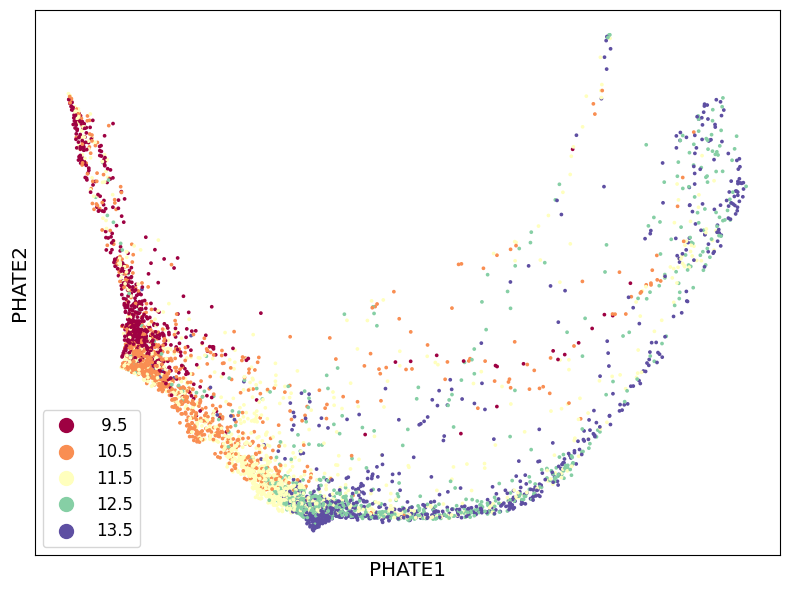

In [13]:
scprep.plot.scatter2d(Y_phate,c = ["%4.1f" % x for x in (pheno_data.loc[T1.index,'day'])] , figsize=(8,6), cmap="Spectral",
                      ticks=False, label_prefix="PHATE")

In [ ]:
#phate_operator.set_params(knn=10)
#Y_phate = phate_operator.fit_transform(T1)

In [ ]:
#scprep.plot.scatter2d(Y_phate,c = ["%4.1f" % x for x in (pheno_data.loc[T1.index,'day'])],
#                      figsize=(8,6), cmap="Spectral",ticks=False, label_prefix="PHATE")

####  Visualize the embedding in 3D

Calculating metric MDS...


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Calculated metric MDS in 43.19 seconds.


<Axes3D: xlabel='PHATE1', ylabel='PHATE2', zlabel='PHATE3'>

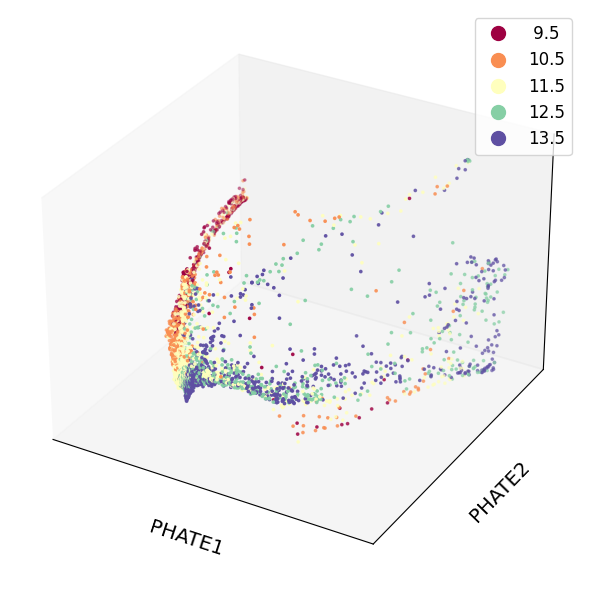

In [14]:
phate_operator.set_params(n_components=3)
Y_phate_3d = phate_operator.transform()
scprep.plot.scatter3d(Y_phate_3d, c = ["%4.1f" % x for x in (pheno_data.loc[T1.index,'day'])]  , figsize=(8,6), cmap="Spectral",
                      ticks=False, label_prefix="PHATE")


#### Create a gif showing the rotating 3D plot

In [15]:
scprep.plot.rotate_scatter3d(Y_phate_3d, c = ["%4.1f" % x for x in (pheno_data.loc[T1.index,'day'])] ,
                             figsize=(8,6), cmap="Spectral",
                             ticks=False, label_prefix="PHATE")

# to save as a gif:
# >>> scprep.plot.rotate_scatter3d(Y_phate_3d, c=sample_labels,
# ...                              figsize=(8,6), cmap="Spectral",
# ...ticks=False, label_prefix="PHATE", filename="phate.gif")
# to save as an mp4:
# >>> scprep.plot.rotate_scatter3d(Y_phate_3d, c=sample_labels,
# ...                              figsize=(8,6), cmap="Spectral",
# ...                              ticks=False, label_prefix="PHATE", filename="phate.mp4")

### Comparison with other visualization tools

In [16]:
import sklearn.decomposition # PCA
import sklearn.manifold # t-SNE
import umap #UMAP
import time


start = time.time()
pca_operator = sklearn.decomposition.PCA(n_components=2)
Y_pca = pca_operator.fit_transform(np.array(T1))
end = time.time()
print("Embedded PCA in {:.2f} seconds.".format(end-start))

start = time.time()
pca_operator = sklearn.decomposition.PCA(n_components=100)
tsne_operator = sklearn.manifold.TSNE(n_components=2)
Y_tsne = tsne_operator.fit_transform(pca_operator.fit_transform(np.array(T1)))
end = time.time()
print("Embedded t-SNE in {:.2f} seconds.".format(end-start))

start = time.time()
Y_umap = umap.UMAP().fit_transform(pca_operator.fit_transform(np.array(T1)))
end = time.time()
print("Embedded UMAP in {:.2f} seconds.".format(end-start))

Embedded PCA in 2.54 seconds.
Embedded t-SNE in 59.01 seconds.
Embedded UMAP in 29.83 seconds.


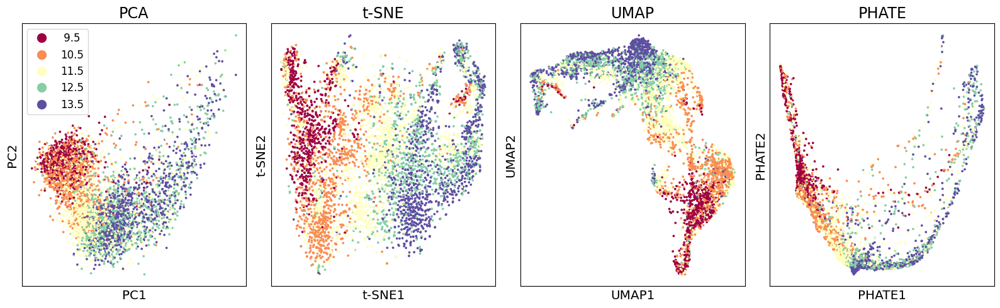

In [17]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize=(16, 5))

#plotting PCA
scprep.plot.scatter2d(Y_pca, label_prefix="PC", title="PCA",
                      c = ["%4.1f" % x for x in (pheno_data.loc[T1.index,'day'])] , ticks=False, cmap='Spectral', ax=ax1)

#plotting tSNE
scprep.plot.scatter2d(Y_tsne, label_prefix="t-SNE", title="t-SNE", legend=False,
                      c = ["%4.1f" % x for x in (pheno_data.loc[T1.index,'day'])] , ticks=False, cmap='Spectral', ax=ax2)

#plotting UMAP
scprep.plot.scatter2d(Y_umap, label_prefix="UMAP", title="UMAP", legend=False,
                      c = ["%4.1f" % x for x in (pheno_data.loc[T1.index,'day'])] , ticks=False, cmap='Spectral', ax=ax3)

#plotting PHATE
scprep.plot.scatter2d(Y_phate, label_prefix="PHATE", title="PHATE", legend=False,
                      c = ["%4.1f" % x for x in (pheno_data.loc[T1.index,'day'])] , ticks=False, cmap='Spectral', ax=ax4)


plt.tight_layout()
plt.show()

## Available in scanpy (as a external API)

In [18]:
import scanpy as sc
import scanpy.external as sce

In [19]:
MOCAdata = sc.read_h5ad(os.path.join(data_path, "MOCA_results.h5ad"))

In [20]:
MOCAdata

AnnData object with n_obs × n_vars = 20000 × 2000
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'louvain', 'leiden', 'louvain_1.0', 'louvain_0.6', 'louvain_0.4', 'louvain_1.4', 'celltype major'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltype major_colors', 'hvg', 'leiden', 'leiden_colors', 'louvain', 'louvain_0.4_colors', 'louvain_0.6_colors', 'louvain_1.0_colors', 'louvain_1.4_colors', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups', 't-test', 'umap', 'wilcoxon'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [21]:
sce.tl.phate(MOCAdata)

/usr/local/lib/python3.10/dist-packages/phate/phate.py:186: FutureWarning: k is deprecated. Please use knn in future.
  warnings.warn("k is deprecated. Please use knn in future.", FutureWarning)
/usr/local/lib/python3.10/dist-packages/phate/phate.py:190: FutureWarning: a is deprecated. Please use decay in future.
  warnings.warn("a is deprecated. Please use decay in future.", FutureWarning)


/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


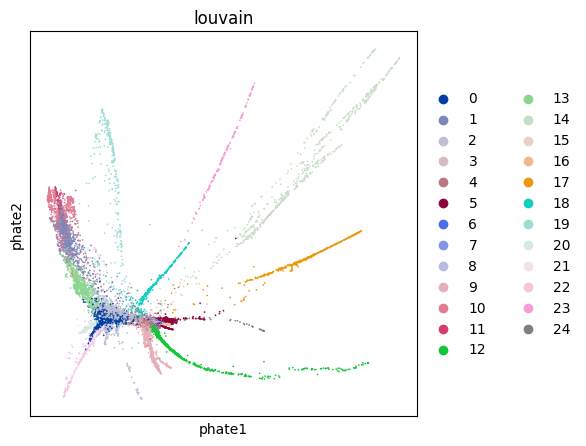

In [22]:
plt.rcParams['figure.figsize'] = (5,5)

sce.pl.phate(MOCAdata, color='louvain')

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


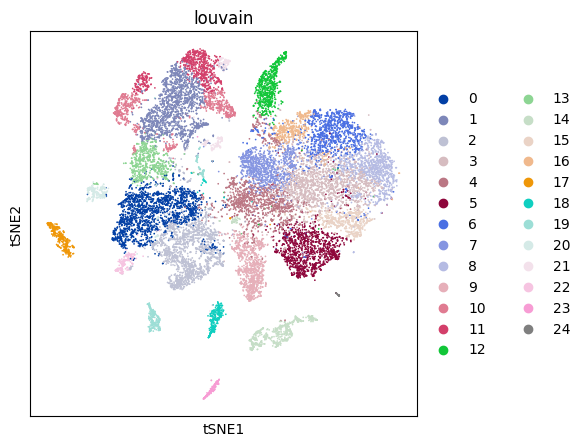

In [23]:
sc.pl.tsne(MOCAdata, color='louvain')

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


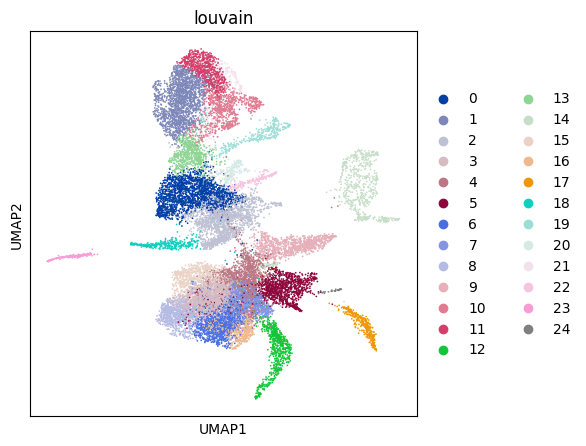

In [24]:
sc.pl.umap(MOCAdata, color='louvain')

In [25]:
MOCAdata.uns['iroot'] = np.argmax(MOCAdata.obsm['X_phate'][:,0])

In [26]:
sc.tl.diffmap(MOCAdata)

In [27]:
sc.tl.dpt(MOCAdata, n_branchings=2)

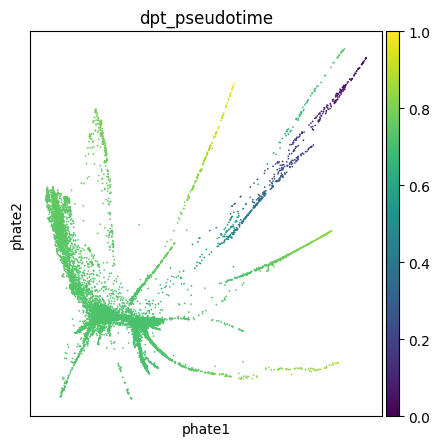

In [28]:
sce.pl.phate(MOCAdata, color = 'dpt_pseudotime')

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


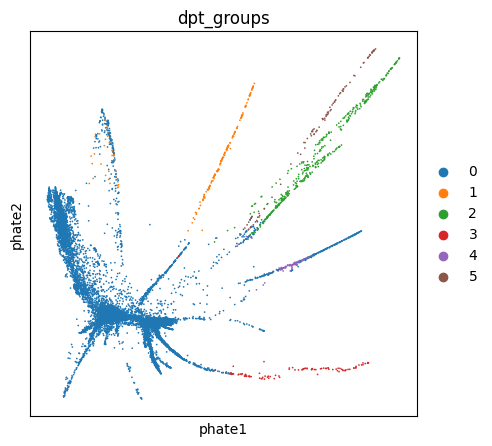

In [29]:
sce.pl.phate(MOCAdata, color = 'dpt_groups')

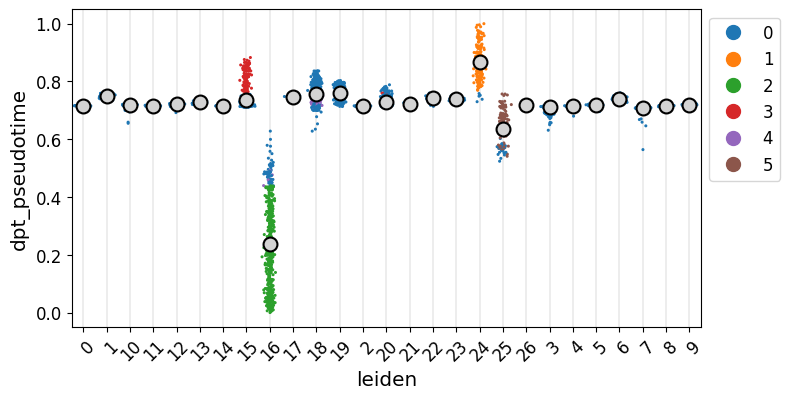

In [30]:
ax = scprep.plot.jitter(MOCAdata.obs['leiden'],
                        MOCAdata.obs['dpt_pseudotime'],
                        c=MOCAdata.obs['dpt_groups'],
                        legend_anchor=(1,1),
                       figsize=(8,4))

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
scprep.plot.utils.shift_ticklabels(ax.xaxis, dx=0.15)